In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.spatial import ConvexHull, QhullError
from scipy.spatial.distance import cdist

%matplotlib inline

In [ ]:
plt.rcParams.update({
    "font.family": "arial",  # Font family for all text
    "font.size": 19,         # Set global font size
    "axes.labelsize": 19,    # Font size for x and y labels
    "axes.titlesize": 19,    # Font size for subplot titles
    "legend.fontsize": 19,   # Font size for legends
    "xtick.labelsize": 18,   # Font size for x-axis tick labels
    "ytick.labelsize": 18,   # Font size for y-axis tick labels
    "grid.alpha": 0.5,       # Transparency for grid lines
    "axes.grid": False,      # Disable grid by default
    "axes.linewidth": 2,   # Thicker axis lines for better visibility
    "xtick.direction": "in", # Ticks inside
    "ytick.direction": "in", # Ticks inside
    "xtick.major.width": 1.8,  # Thicker major x-ticks
    "ytick.major.width": 1.8,  # Thicker major y-ticks
    "xtick.minor.width": 1.5,  # Thicker minor x-ticks
    "ytick.minor.width": 1.5,  # Thicker minor y-ticks
    "xtick.major.size": 8,   # Longer major x-ticks
    "ytick.major.size": 8,   # Longer major y-ticks
    "xtick.minor.size": 4,   # Longer minor x-ticks
    "ytick.minor.size": 4,   # Longer minor y-ticks
    "legend.frameon": False, # Remove the legend frame
    "figure.dpi": 450        # Keeps text sharp
})

In [ ]:
df = pd.read_excel("....")

x = df['x'].to_numpy()
y = df['y'].to_numpy()
intensity = df['intensity'].to_numpy()

np.max(intensity), np.min(intensity)

(83.20077920333176, 28.39132965530106)

In [4]:
def calculate_radius_from_area(points, min_radius=21.24):
    """
    Calculate the radius of a cluster, enforcing a minimum radius of 3 µm.
    But this radius is pixel radius, so 3 * 3540/500 is taken as the radius (3*7.08)
    For single-point clusters, returns `min_radius`.
    For collinear or ambiguous clusters, uses maximum pairwise distance.
    """
    unique_points = np.unique(points, axis=0)
    n_points = len(unique_points)

    # Edge cases: single point or no points
    if n_points == 0:
        return 0.0  # Handle empty input gracefully
    if n_points == 1:
        return min_radius  # Single particle has minimum radius

    # For two points, use half their distance (capped at min_radius)
    if n_points == 2:
        distance = np.linalg.norm(unique_points[0] - unique_points[1])
        return max(distance / 2, min_radius)

    # For collinear points, use max pairwise distance (capped at min_radius)
    if are_collinear(unique_points):
        pairwise_distances = np.linalg.norm(unique_points[:, np.newaxis] - unique_points, axis=2)
        max_distance = np.max(pairwise_distances)
        return max(max_distance / 2, min_radius)

    # For non-collinear points, use convex hull area (capped at min_radius)
    try:
        hull = ConvexHull(unique_points)
        area = hull.volume  # In 2D, "volume" is the convex hull area
        radius = np.sqrt(area / np.pi)
        return max(radius, min_radius)
    except QhullError:
        # Fallback: use max pairwise distance if convex hull fails
        pairwise_distances = np.linalg.norm(unique_points[:, np.newaxis] - unique_points, axis=2)
        max_distance = np.max(pairwise_distances)
        return max(max_distance / 2, min_radius)
    except Exception as e:
        return min_radius  # Catch-all fallback

def are_collinear(points):
    """Check if points are collinear using vectorized cross-product checks."""
    if len(points) < 3:
        return True
    vec1 = points[1] - points[0]
    cross_products = np.cross(vec1, points[2:] - points[0])
    return np.allclose(cross_products, 0, atol=1e-8)  # Tolerance for floating-point precision

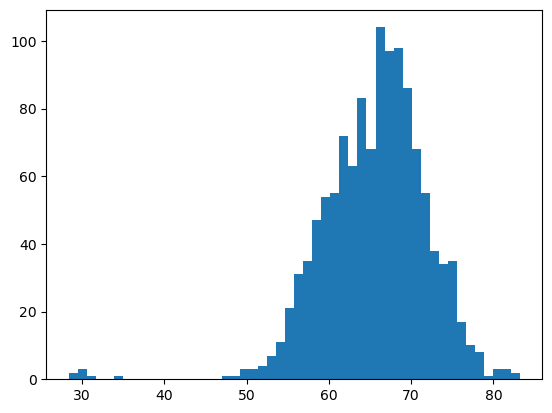

In [3]:
plt.hist(intensity, bins = 50)
plt.show()

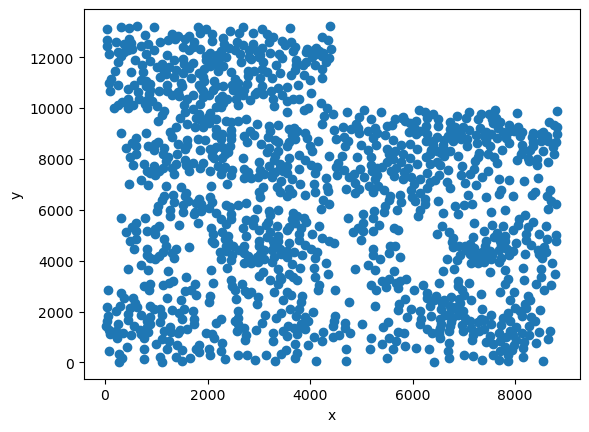

In [4]:
plt.scatter(x, y)
plt.ylabel('y')
plt.xlabel('x')
plt.show()

Correlation and Covariance

In [5]:
cov_x = np.cov(x, intensity)
cov_y = np.cov(y, intensity)
cov_x, cov_y

(array([[6.36345382e+06, 2.62647952e+01],
        [2.62647952e+01, 3.96036058e+01]]),
 array([[ 1.34715369e+07, -3.37437701e+03],
        [-3.37437701e+03,  3.96036058e+01]]))

In [6]:
### Correlations ###
rho_x = np.corrcoef(x, intensity)
rho_y = np.corrcoef(y, intensity)
rho_x, rho_y

(array([[1.        , 0.00165447],
        [0.00165447, 1.        ]]),
 array([[ 1.        , -0.14608905],
        [-0.14608905,  1.        ]]))

Plotly plots

Scatter Plot

In [7]:
import plotly.express as px

# Create 2D scatter plot where intensity is mapped to the color scale
fig = px.scatter(df, x='x', y='y', color='intensity', 
                 color_continuous_scale='Viridis', 
                 title='2D Scatter Plot with Intensity Color Mapping')

fig.update_layout(width=1000, height=800)
fig.show()

In [8]:
import plotly.express as px

fig = px.scatter_3d(
    df, x='x', y='y', z='intensity',
    color='intensity', color_continuous_scale='Viridis',
    title='3D Scatter Plot of Intensity',
    labels={'x': 'X (pixels)', 'y': 'Y (pixels)', 'intensity': 'Intensity'}
)
fig.update_layout(width=1000, height=800)
fig.show()

Heatmap

In [9]:
import plotly.graph_objects as go
import numpy as np

# Bin the data into a 2D grid using numpy's histogram2d
x_edges = np.linspace(df['x'].min(), df['x'].max(), 50)  # Adjust the number of bins as needed
y_edges = np.linspace(df['y'].min(), df['y'].max(), 50)

# Create the 2D histogram with intensity as the third dimension
heatmap, x_edges, y_edges = np.histogram2d(df['x'], df['y'], bins=[x_edges, y_edges], weights=df['intensity'])

# Plot the heatmap using Plotly
fig = go.Figure(go.Heatmap(
    x=x_edges,  # x-axis values (edges of the bins)
    y=y_edges,  # y-axis values (edges of the bins)
    z=heatmap.T,  # Transpose to match the orientation
    colorscale='Viridis'
))

fig.update_layout(
    title='Heatmap of Intensity',
    xaxis_title='X Axis',
    yaxis_title='Y Axis',
    width=1000,
    height=800
)

fig.show()

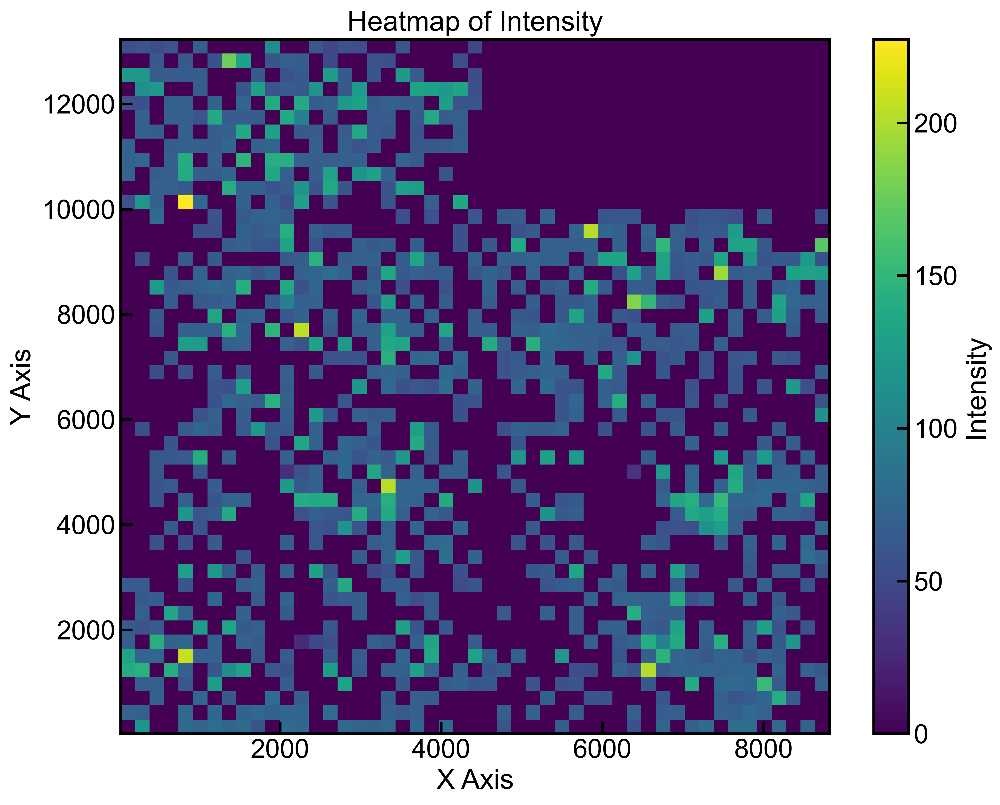

In [17]:
x_edges = np.linspace(df['x'].min(), df['x'].max(), 50)
y_edges = np.linspace(df['y'].min(), df['y'].max(), 50)

# Create 2D histogram
heatmap, xedges, yedges = np.histogram2d(df['x'], df['y'], bins=[x_edges, y_edges], weights=df['intensity'])

# Plot using matplotlib
fig, ax = plt.subplots(figsize=(10, 8))

# pcolormesh wants bin edges, and heatmap should be transposed
c = ax.pcolormesh(xedges, yedges, heatmap.T, cmap='viridis', shading='auto')

fig.colorbar(c, ax=ax, label='Intensity')
ax.set_title('Heatmap of Intensity')
ax.set_xlabel('X Axis')
ax.set_ylabel('Y Axis')

plt.tight_layout()
plt.show()

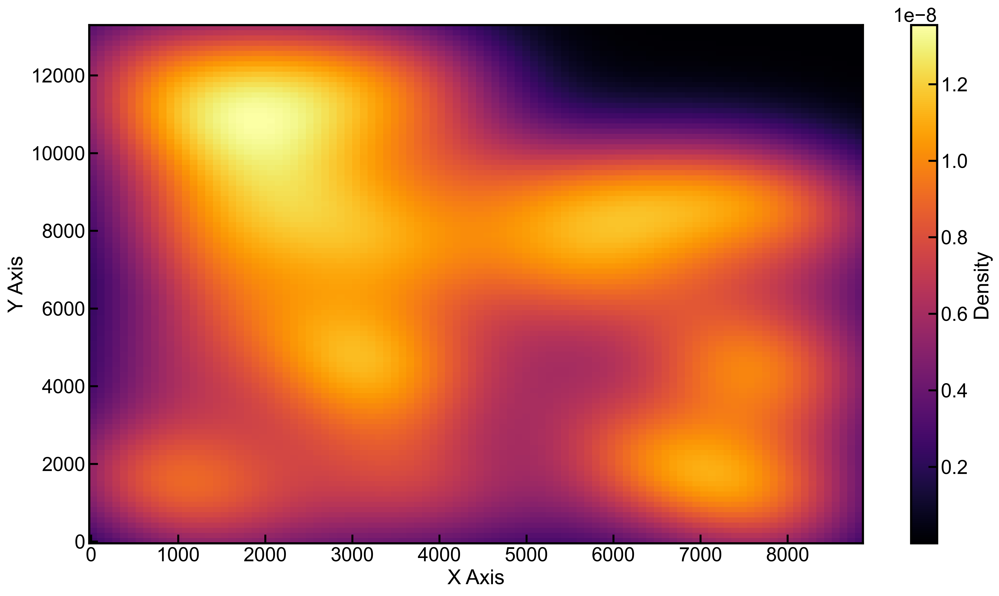

In [22]:
from scipy.stats import gaussian_kde

# Sample coordinates and intensities
values = np.vstack([df['x'], df['y']])
kde = gaussian_kde(values, weights=df['intensity'])

# Create grid to evaluate KDE
xgrid = np.linspace(df['x'].min(), df['x'].max(), 100)
ygrid = np.linspace(df['y'].min(), df['y'].max(), 100)
X, Y = np.meshgrid(xgrid, ygrid)
Z = kde(np.vstack([X.ravel(), Y.ravel()])).reshape(X.shape)

plt.figure(figsize=(14, 8))
plt.pcolormesh(X, Y, Z, cmap='inferno', shading = 'auto')
plt.colorbar(label='Density')
#plt.title('Smoothed KDE Heatmap')
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.tight_layout()
plt.show()

Bubble Plot

In [10]:
import plotly.express as px

# Create a bubble plot where bubble size represents intensity
fig = px.scatter(df, x='x', y='y', size='intensity', 
                 color='intensity', color_continuous_scale='Viridis',
                 title='Bubble Plot with Intensity Size')

fig.update_layout(width=1000, height=800)
fig.show()


Hexbin Plot

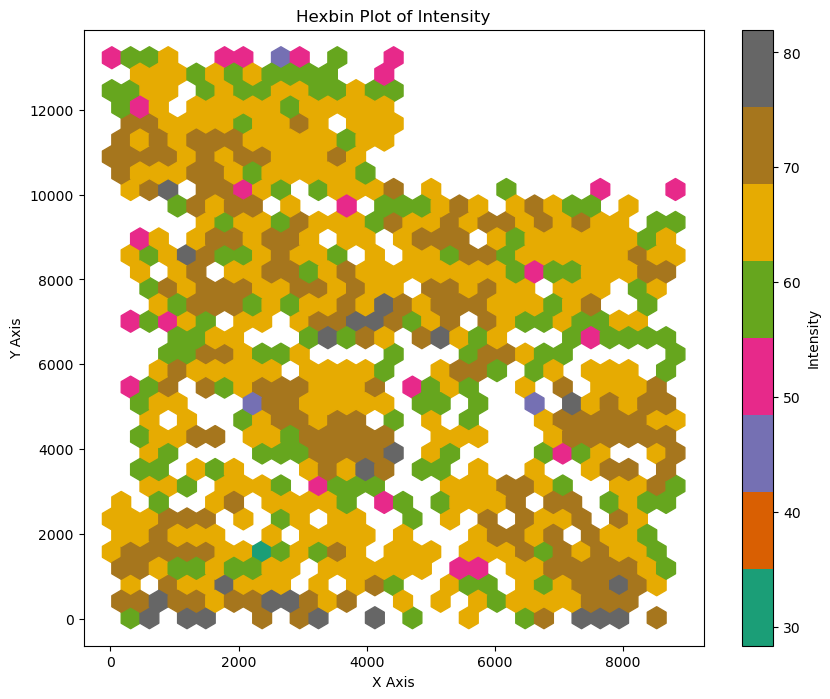

In [11]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.hexbin(df['x'], df['y'], C=df['intensity'], gridsize=30, cmap='Dark2')
plt.colorbar(label='Intensity')
plt.title('Hexbin Plot of Intensity')
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.show()


## Cluster Convergence

In [13]:
len(df['intensity'])

1225

c:\Users\aishw\anaconda3\envs\torchDamage\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.



Cluster Diameters (Convex Hull): [1121.6914201449626, 884.5226472191441, 1064.2824490066953, 991.3643237365822, 1042.0351423173718, 1119.6101956604373, 938.1486240773822, 1178.7855066231762, 1208.2815739259115, 1002.6034629785132, 822.0298248047251, 1045.9357725791142, 1041.1180951525166, 1051.0410262051937, 1018.7868842129993, 945.1526852488099, 1193.871189493661, 971.7450407413429, 981.797888505992, 1038.6731549051717, 1127.986012921474, 974.5197622403522, 1075.8628034949124, 1241.8313946501514, 1417.8163329454749, 1100.2825534406884, 1199.657045665333, 1424.4338798441008, 1029.1643855112518, 955.2185283899665, 775.869258260899, 1026.3595425089159, 985.7726865865262, 935.1019344565567, 1177.6822713991264, 996.4974292023136, 931.4605368192279, 1189.9736945694267, 861.6207924761214, 894.9355165584197, 1202.6871539666968, 1092.7212561496133, 1214.4371616489009, 1006.15624869376, 1054.6107688080635, 1211.8006470064831, 1016.8422042616907, 879.439868179803, 896.3026953747125, 1242.6328109

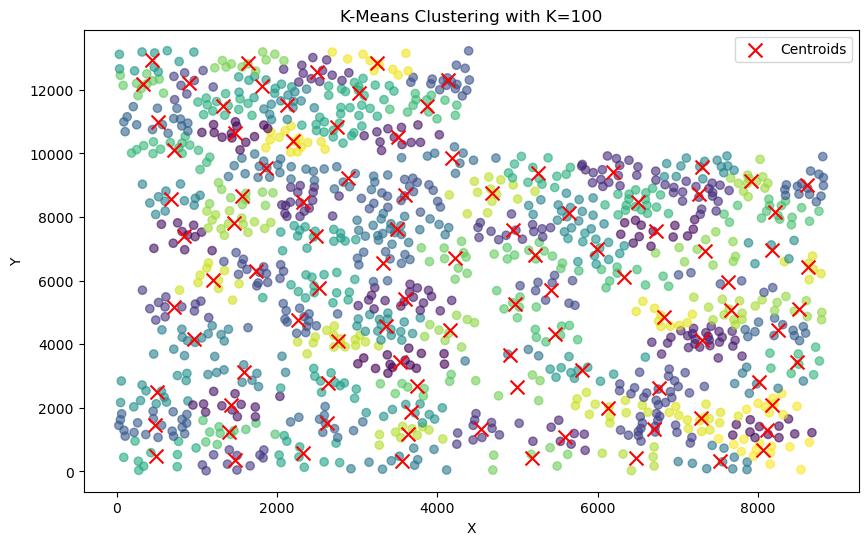

In [16]:
### Testing Convex Hull for getting distances ###

from scipy.spatial import ConvexHull

K = 100
# Fit K-Means clustering
kmeans = KMeans(n_clusters=K, random_state=42)
df['Cluster'] = kmeans.fit_predict(df[['x', 'y']])

# Calculate cluster radii
cluster_radii = []

# Group the DataFrame by 'Cluster'
for cluster_id, cluster_points in df.groupby('Cluster'):
    points = cluster_points[['x', 'y']].values  # Extract points in the cluster
    
    # Ensure there are enough points for ConvexHull (minimum of 3 points)
    if len(points) > 2:
        hull = ConvexHull(points)
        hull_vertices = points[hull.vertices]
        
        # Calculate pairwise distances between hull vertices
        distances = [np.linalg.norm(p1 - p2) for p1 in hull_vertices for p2 in hull_vertices]
        max_distance = max(distances)
        cluster_radii.append(max_distance)
    else:
        # Handle cases with fewer points (e.g., 1 or 2 points)
        cluster_radii.append(0)

# Print or visualize the cluster radii
print("Cluster Diameters (Convex Hull):", cluster_radii)

# Plot the clusters for visualization
plt.figure(figsize=(10, 6))
plt.scatter(df['x'], df['y'], c=df['Cluster'], cmap='viridis', marker='o', alpha=0.6)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color='red', marker='x', s=100, label='Centroids')
plt.title(f'K-Means Clustering with K={K}')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.show()


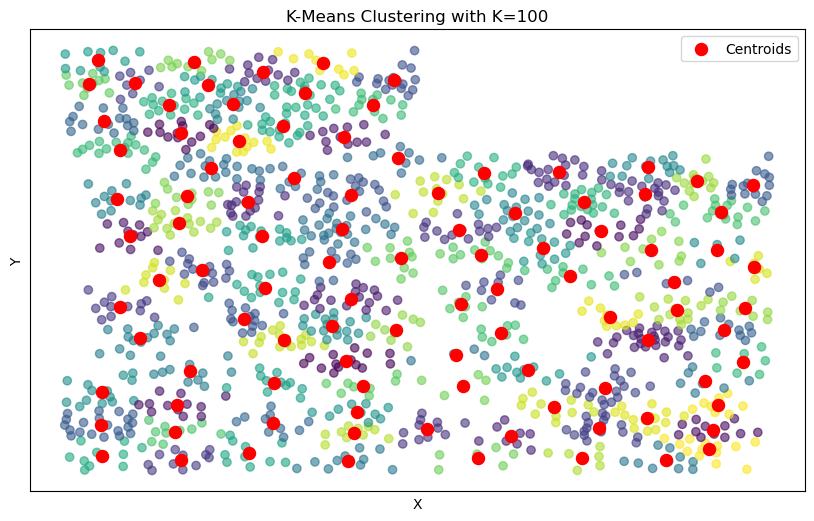

In [17]:
# Plot the clusters for visualization
plt.figure(figsize=(10, 6))
plt.scatter(df['x'], df['y'], c=df['Cluster'], cmap='viridis', marker='o', alpha=0.6)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color='red', marker='o', s=75, label='Centroids')
plt.title(f'K-Means Clustering with K={K}')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend()

plt.xticks([])
plt.yticks([])

plt.show()


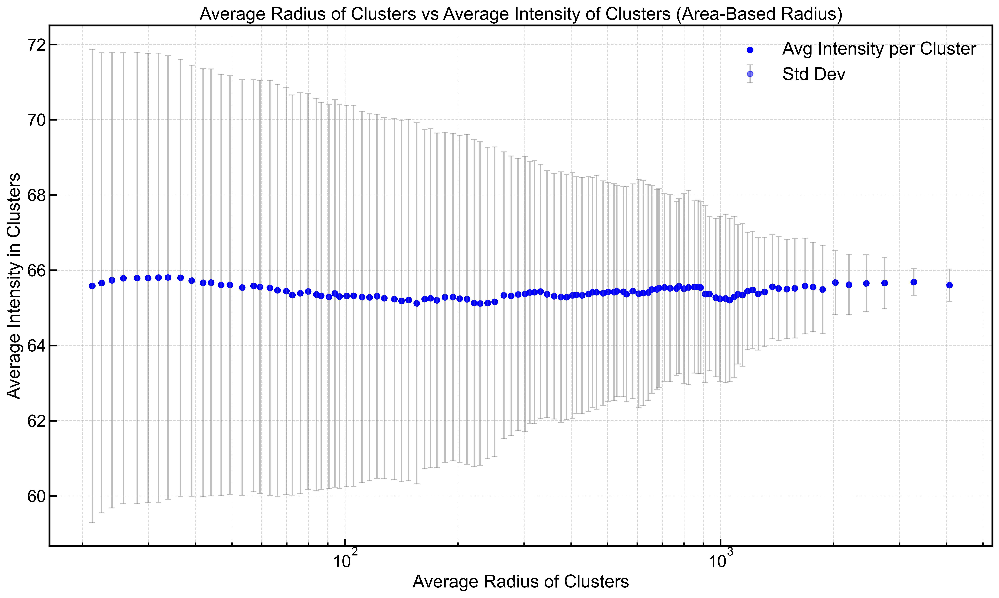

In [ ]:
# from scipy.spatial import ConvexHull

# def calculate_radius_from_area(points):
#     """
#     Calculate the radius of a cluster based on its area using the formula:
#     Area = pi * r^2 => r = sqrt(Area / pi).
#     """
#     if len(points) > 2:  # Convex Hull requires at least 3 points
#         hull = ConvexHull(points)
#         area = hull.volume  # Volume of 2D convex hull is its area
#         radius = np.sqrt(area / np.pi)
#         return radius
#     elif len(points) == 2:  # Two points form a line, use half the distance as radius
#         return np.linalg.norm(points[0] - points[1]) / 2
#     else:  # Single point has no meaningful radius
#         return 0

# Define K range
k_min = 2
k_max = len(df['intensity'])
num_points = 150
k_values = np.unique(np.round(np.logspace(np.log10(k_min), np.log10(k_max), num=num_points)).astype(int))

# Lists to store average values for plotting
avg_particles_per_cluster = []
avg_intensity_per_cluster = []
avg_intensity = []
std_int = []
cluster_radii_avg = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    df['Cluster'] = kmeans.fit_predict(df[['x', 'y']])

    # Calculate average intensity per cluster
    int_average = df.groupby('Cluster')['intensity'].mean().values
    avg_intensity_per_cluster.append(int_average)
    avg_intensity.append(np.mean(int_average))
    
    # Calculate standard deviation of average intensity
    std_dev1 = np.nanstd(int_average)
    std_int.append(std_dev1)

    # Calculate average cluster radius using area-based method
    radii = []
    for cluster_id, cluster_points in df.groupby('Cluster'):
        points = cluster_points[['x', 'y']].values
        radius = calculate_radius_from_area(points)
        radii.append(radius)
    cluster_radii_avg.append(np.mean(radii))

# Plotting average number of particles per cluster vs average intensity
plt.figure(figsize=(18, 10))
plt.scatter(cluster_radii_avg, avg_intensity, color='blue', marker='o', label='Avg Intensity per Cluster')

# Add error bars for standard deviation
plt.errorbar(cluster_radii_avg, avg_intensity, 
             yerr=std_int, fmt='o', color='blue', ecolor='gray', alpha=0.5, capsize=3, label='Std Dev')

plt.title('Average Radius of Clusters vs Average Intensity of Clusters (Area-Based Radius)')
plt.xlabel('Average Radius of Clusters')
plt.ylabel('Average Intensity in Clusters')
plt.grid(True, which='both', axis='both', linestyle='--', alpha=0.5)
plt.legend(loc='best')
plt.xscale('log')
plt.show()


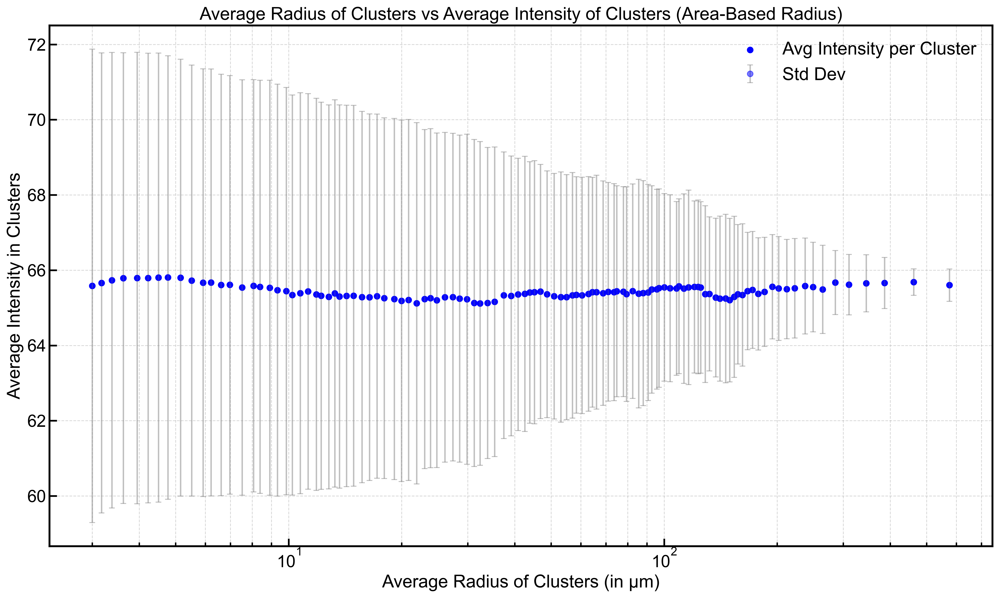

In [6]:
scale_factor = 500 / 3540  # μm/pixel 

# Scale the x-axis data
scaled_cluster_radii_avg = [radius * scale_factor for radius in cluster_radii_avg]

plt.figure(figsize=(18, 10))
plt.scatter(scaled_cluster_radii_avg, avg_intensity, color='blue', marker='o', label='Avg Intensity per Cluster')

# Add error bars for standard deviation
plt.errorbar(scaled_cluster_radii_avg, avg_intensity, 
             yerr=std_int, fmt='o', color='blue', ecolor='gray', alpha=0.5, capsize=3, label='Std Dev')

plt.title('Average Radius of Clusters vs Average Intensity of Clusters (Area-Based Radius)')
plt.xlabel('Average Radius of Clusters (in μm)')
plt.ylabel('Average Intensity in Clusters')
plt.grid(True, which='both', axis='both', linestyle='--', alpha=0.5)
plt.legend(loc='best')
plt.xscale('log')
plt.show()

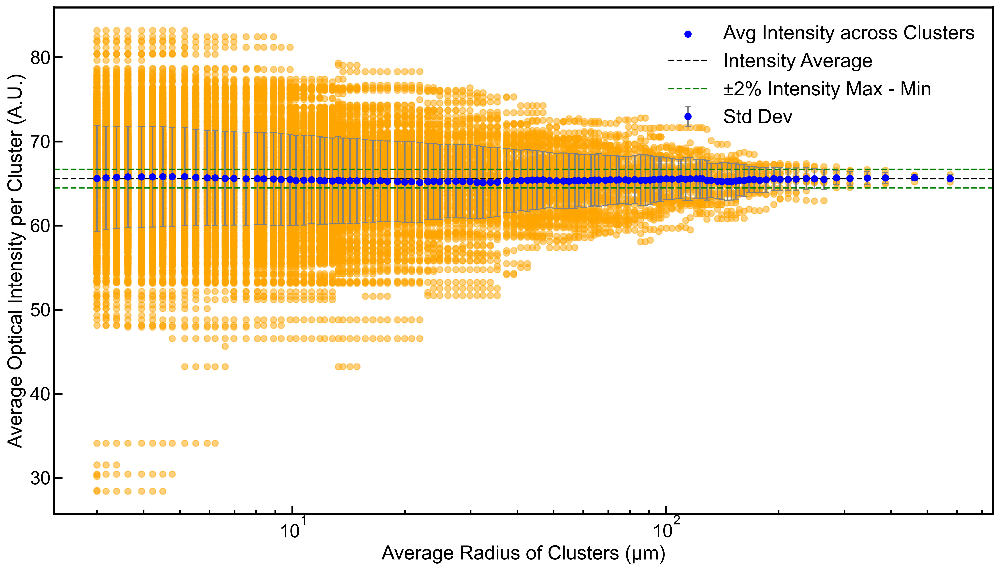

In [ ]:
# Calculate max and min intensity
max_intensity = df['intensity'].max()
min_intensity = df['intensity'].min()
avg_int = df['intensity'].mean()

# Calculate the difference and percentages
intensity_diff = max_intensity - min_intensity
plus_2_percent = avg_int + 0.02 * intensity_diff
minus_2_percent = avg_int - 0.02 * intensity_diff
plus_5_percent = avg_int + 0.05 * intensity_diff
minus_5_percent = avg_int - 0.05 * intensity_diff

# Define x-axis limits based on the range of cluster radii
x_min = min(scaled_cluster_radii_avg) * 0.8  # Slightly smaller for padding
x_max = max(scaled_cluster_radii_avg) * 1.2  # Slightly larger for padding

# Plotting with horizontal lines
plt.figure(figsize=(14, 8))
plt.scatter(scaled_cluster_radii_avg, avg_intensity, color='blue', marker='o', label='Avg Intensity across Clusters')

# Add individual intensities as vertical lines
for x, intensities in zip(scaled_cluster_radii_avg, avg_intensity_per_cluster):
    y_values = intensities  # All individual intensities for the cluster
    x_values = [x] * len(y_values)  # Same x-coordinate for all points
    plt.scatter(x_values, y_values, color='orange', alpha=0.5)

# Add error bars for standard deviation
plt.errorbar(scaled_cluster_radii_avg, avg_intensity, 
             yerr=std_int, fmt='o', color='blue', ecolor='gray', alpha=1.0, capsize=3, label='Std Dev')

# Add horizontal lines
plt.axhline(y= avg_int, color='black', linestyle='--', linewidth=1.5, label='Intensity Average')
plt.axhline(y=plus_2_percent, color='green', linestyle='--', linewidth=1.5, label='±2% Intensity Max - Min')
plt.axhline(y=minus_2_percent, color='green', linestyle='--', linewidth=1.5)
# plt.axhline(y=plus_5_percent, color='red', linestyle='--', linewidth=1.5, label='+5% Intensity Max - Min')
# plt.axhline(y=minus_5_percent, color='red', linestyle='--', linewidth=1.5, label='-5% Intensity Max - Min')


#plt.title('Average Radius of Clusters vs Average Intensity of Clusters for NMC 622 c_SOC = 91%')
plt.xlabel('Average Radius of Clusters (μm)')
plt.ylabel('Average Optical Intensity per Cluster (A.U.)')
#plt.grid(True, which='both', axis='both', linestyle='--', alpha=0.5)
plt.legend(frameon = False, loc = 'upper right')
plt.tight_layout()
plt.xscale('log')
plt.show()

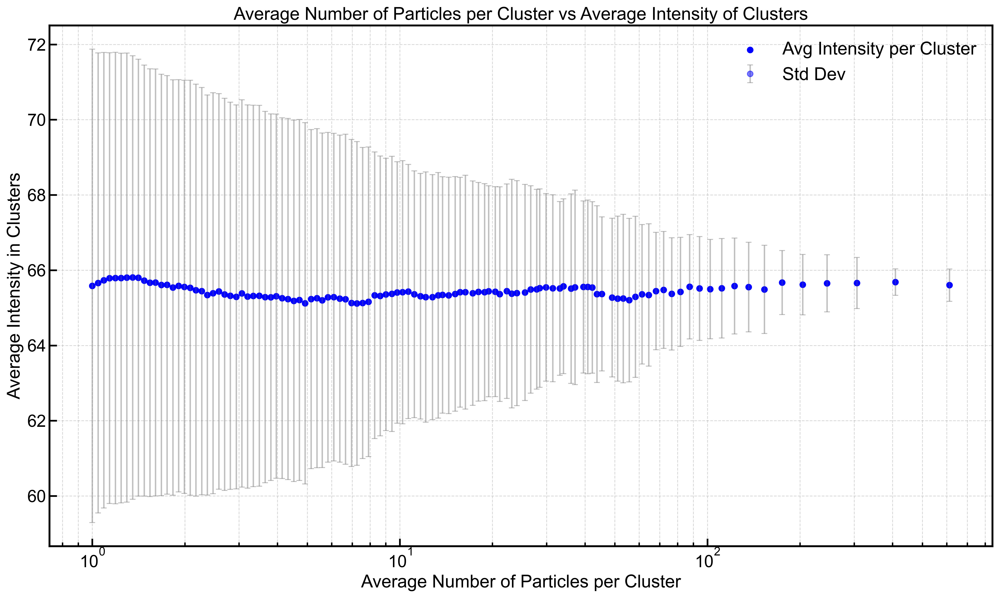

In [8]:
# Define K range
k_min = 2
k_max = len(df['intensity'])
num_points = 150
k_values = np.unique(np.round(np.logspace(np.log10(k_min), np.log10(k_max), num=num_points)).astype(int))

# Calculate the average number of particles per cluster for each K
avg_particles_per_cluster = []
avg_intensity = []
std_int1 = []
count_average = {}
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    df['Cluster'] = kmeans.fit_predict(df[['x', 'y']])

    int_average = df.groupby('Cluster')['intensity'].mean().values
    avg_intensity.append(np.mean(int_average))
    counts_per_cluster = df['Cluster'].value_counts().values
    #avg_particles = np.mean(counts_per_cluster)
    avg_particles_per_cluster.append(np.mean(counts_per_cluster))
    std_dev2 = np.nanstd(np.array(int_average))
    std_int1.append(std_dev2)

    count_average[k] = counts_per_cluster


plt.figure(figsize=(18, 10))
plt.scatter(avg_particles_per_cluster, avg_intensity, color='blue', marker='o', label='Avg Intensity per Cluster')


plt.errorbar(avg_particles_per_cluster, avg_intensity, 
             yerr=std_int1, fmt='o', color='blue', ecolor='gray', alpha=0.5, capsize=3, label='Std Dev')

plt.title('Average Number of Particles per Cluster vs Average Intensity of Clusters')
plt.xlabel('Average Number of Particles per Cluster')
plt.ylabel('Average Intensity in Clusters')
plt.grid(True, which='both', axis='both', linestyle='--', alpha=0.5)
plt.legend(loc='best')
plt.xscale('log')
plt.show()

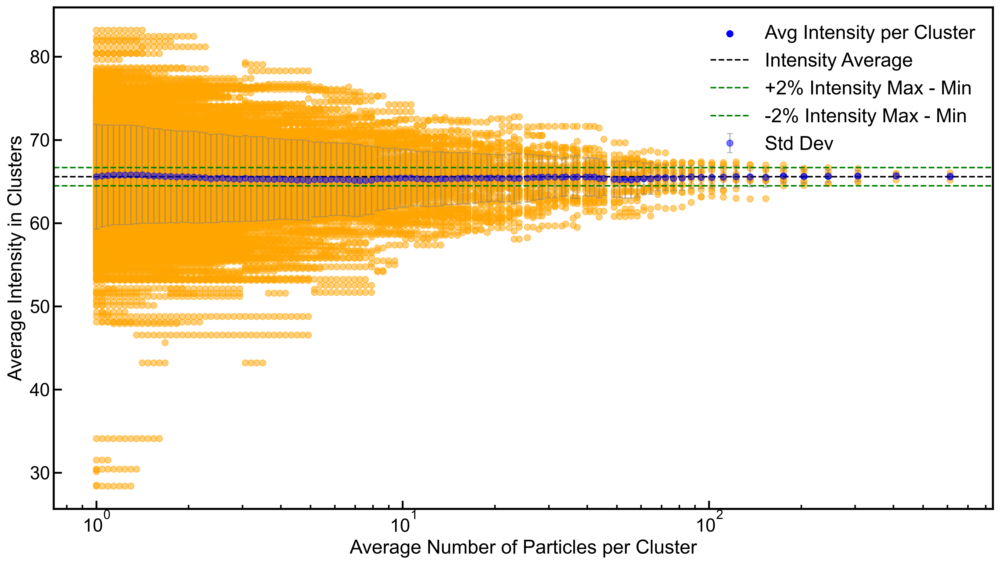

In [9]:
# Calculate max and min intensity
max_intensity = df['intensity'].max()
min_intensity = df['intensity'].min()
avg_int = df['intensity'].mean()

# Calculate the difference and percentages
intensity_diff = max_intensity - min_intensity
plus_2_percent = avg_int + 0.02 * intensity_diff
minus_2_percent = avg_int - 0.02 * intensity_diff
plus_5_percent = avg_int + 0.05 * intensity_diff
minus_5_percent = avg_int - 0.05 * intensity_diff

# Define x-axis limits based on the range of cluster radii
x_min = min(cluster_radii_avg) * 0.8  # Slightly smaller for padding
x_max = max(cluster_radii_avg) * 1.2  # Slightly larger for padding


plt.figure(figsize=(14, 8))

# Scatter plot for average intensity per cluster vs. average particles per cluster
plt.scatter(avg_particles_per_cluster, avg_intensity, color='blue', marker='o', label='Avg Intensity per Cluster')


for x, intensities in zip(avg_particles_per_cluster, avg_intensity_per_cluster):
    y_values = intensities  # All individual intensities for the cluster
    x_values = [x] * len(y_values)  # Same x-coordinate for all points
    plt.scatter(x_values, y_values, color='orange', alpha=0.5)

# Add error bars for standard deviation
plt.errorbar(avg_particles_per_cluster, avg_intensity, 
             yerr=std_int1, fmt='o', color='blue', ecolor='gray', alpha=0.5, capsize=3, label='Std Dev')

plt.axhline(y= avg_int, color='black', linestyle='--', linewidth=1.5, label='Intensity Average')
plt.axhline(y=plus_2_percent, color='green', linestyle='--', linewidth=1.5, label='+2% Intensity Max - Min')
plt.axhline(y=minus_2_percent, color='green', linestyle='--', linewidth=1.5, label='-2% Intensity Max - Min')
# plt.axhline(y=plus_5_percent, color='red', linestyle='--', linewidth=1.5, label='+5% Intensity Max - Min')
# plt.axhline(y=minus_5_percent, color='red', linestyle='--', linewidth=1.5, label='-5% Intensity Max - Min')

# Add title and labels
#plt.title('Average Number of Particles per Cluster vs Average Intensity of Clusters')
plt.xlabel('Average Number of Particles per Cluster')
plt.ylabel('Average Intensity in Clusters')

# Add grid and legend
#plt.grid(True, which='both', axis='both', linestyle='--', alpha=0.5)
plt.legend(loc='upper right')
plt.tight_layout()
# Use a logarithmic scale for the x-axis
plt.xscale('log')

# Display the plot
plt.show()

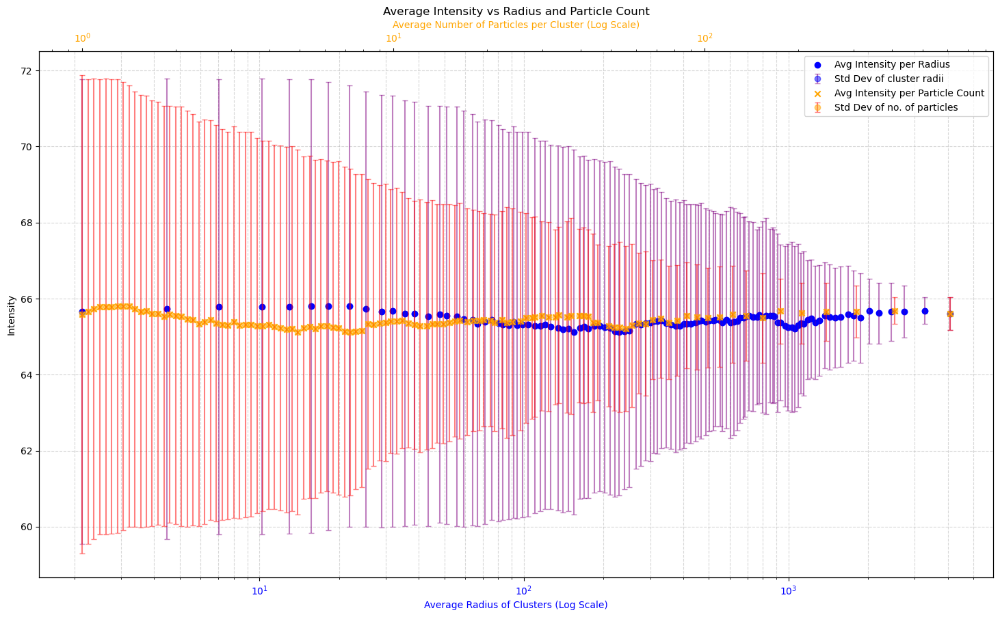

In [28]:
fig, ax1 = plt.subplots(figsize=(18, 10))

# Primary x-axis: Average Radius
ax1.scatter(cluster_radii_avg, avg_intensity, color='blue', marker='o', label='Avg Intensity per Radius')
ax1.errorbar(cluster_radii_avg, avg_intensity, yerr=std_int, fmt='o', color='blue', ecolor='purple', alpha=0.5, capsize=3, label='Std Dev of cluster radii')
ax1.set_xscale('log')
ax1.set_xlabel('Average Radius of Clusters (Log Scale)', color='blue')
ax1.tick_params(axis='x', labelcolor='blue')
ax1.set_ylabel('Intensity')
ax1.grid(True, which='both', axis='both', linestyle='--', alpha=0.5)

# Secondary x-axis: Number of Particles per Cluster
ax2 = ax1.twiny()
ax2.scatter(avg_particles_per_cluster, avg_intensity, color='orange', marker='x', label='Avg Intensity per Particle Count')
ax2.errorbar(avg_particles_per_cluster, avg_intensity, yerr=std_int1, fmt='o', color='orange', ecolor='red', alpha=0.5, capsize=3, label='Std Dev of no. of particles')
ax2.set_xscale('log')
ax2.set_xlabel('Average Number of Particles per Cluster (Log Scale)', color='orange')
ax2.tick_params(axis='x', labelcolor='orange')

# Combine legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='best')

plt.title('Average Intensity vs Radius and Particle Count')
plt.show()


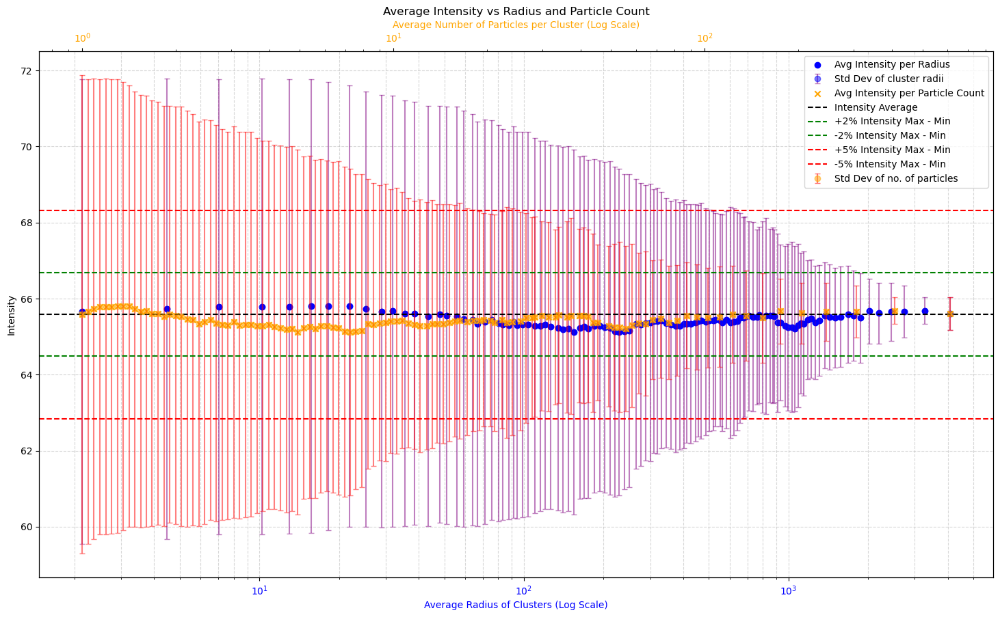

In [29]:
fig, ax1 = plt.subplots(figsize=(18, 10))

# Primary x-axis: Average Radius
ax1.scatter(cluster_radii_avg, avg_intensity, color='blue', marker='o', label='Avg Intensity per Radius')
ax1.errorbar(cluster_radii_avg, avg_intensity, yerr=std_int, fmt='o', color='blue', ecolor='purple', alpha=0.5, capsize=3, label='Std Dev of cluster radii')
ax1.set_xscale('log')
ax1.set_xlabel('Average Radius of Clusters (Log Scale)', color='blue')
ax1.tick_params(axis='x', labelcolor='blue')
ax1.set_ylabel('Intensity')
ax1.grid(True, which='both', axis='both', linestyle='--', alpha=0.5)

# Secondary x-axis: Number of Particles per Cluster
ax2 = ax1.twiny()
ax2.scatter(avg_particles_per_cluster, avg_intensity, color='orange', marker='x', label='Avg Intensity per Particle Count')
ax2.errorbar(avg_particles_per_cluster, avg_intensity, yerr=std_int1, fmt='o', color='orange', ecolor='red', alpha=0.5, capsize=3, label='Std Dev of no. of particles')
ax2.set_xscale('log')
ax2.set_xlabel('Average Number of Particles per Cluster (Log Scale)', color='orange')
ax2.tick_params(axis='x', labelcolor='orange')


plt.axhline(y= avg_int, color='black', linestyle='--', linewidth=1.5, label='Intensity Average')
plt.axhline(y=plus_2_percent, color='green', linestyle='--', linewidth=1.5, label='+2% Intensity Max - Min')
plt.axhline(y=minus_2_percent, color='green', linestyle='--', linewidth=1.5, label='-2% Intensity Max - Min')
plt.axhline(y=plus_5_percent, color='red', linestyle='--', linewidth=1.5, label='+5% Intensity Max - Min')
plt.axhline(y=minus_5_percent, color='red', linestyle='--', linewidth=1.5, label='-5% Intensity Max - Min')


# Combine legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='best')

plt.title('Average Intensity vs Radius and Particle Count')
plt.show()

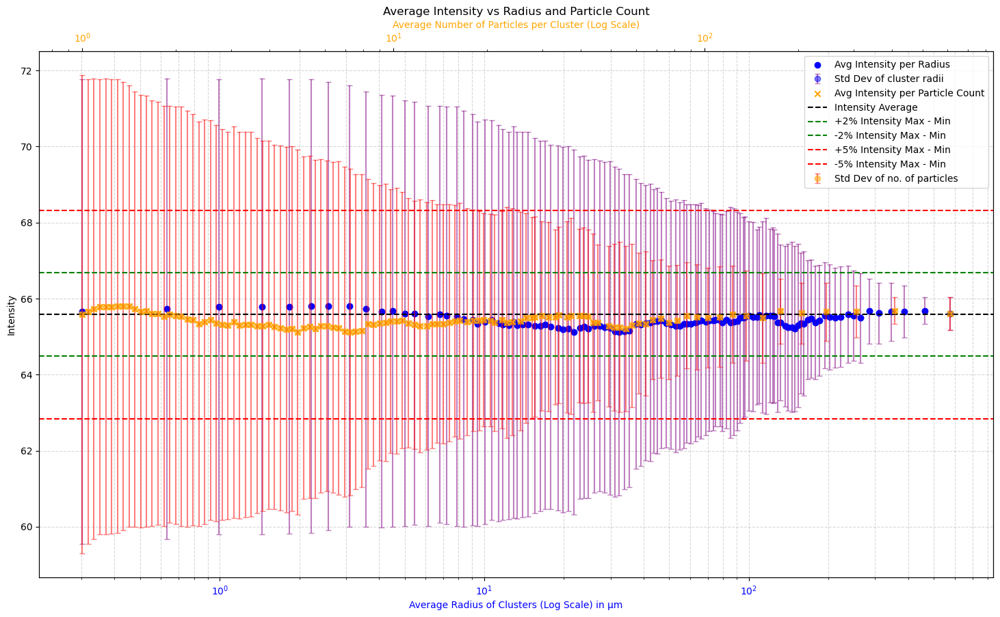

In [30]:
fig, ax1 = plt.subplots(figsize=(18, 10))

# Primary x-axis: Average Radius
ax1.scatter(scaled_cluster_radii_avg, avg_intensity, color='blue', marker='o', label='Avg Intensity per Radius')
ax1.errorbar(scaled_cluster_radii_avg, avg_intensity, yerr=std_int, fmt='o', color='blue', ecolor='purple', alpha=0.5, capsize=3, label='Std Dev of cluster radii')
ax1.set_xscale('log')
ax1.set_xlabel('Average Radius of Clusters (Log Scale) in μm', color='blue')
ax1.tick_params(axis='x', labelcolor='blue')
ax1.set_ylabel('Intensity')
ax1.grid(True, which='both', axis='both', linestyle='--', alpha=0.5)

# Secondary x-axis: Number of Particles per Cluster
ax2 = ax1.twiny()
ax2.scatter(avg_particles_per_cluster, avg_intensity, color='orange', marker='x', label='Avg Intensity per Particle Count')
ax2.errorbar(avg_particles_per_cluster, avg_intensity, yerr=std_int1, fmt='o', color='orange', ecolor='red', alpha=0.5, capsize=3, label='Std Dev of no. of particles')
ax2.set_xscale('log')
ax2.set_xlabel('Average Number of Particles per Cluster (Log Scale)', color='orange')
ax2.tick_params(axis='x', labelcolor='orange')


plt.axhline(y= avg_int, color='black', linestyle='--', linewidth=1.5, label='Intensity Average')
plt.axhline(y=plus_2_percent, color='green', linestyle='--', linewidth=1.5, label='+2% Intensity Max - Min')
plt.axhline(y=minus_2_percent, color='green', linestyle='--', linewidth=1.5, label='-2% Intensity Max - Min')
plt.axhline(y=plus_5_percent, color='red', linestyle='--', linewidth=1.5, label='+5% Intensity Max - Min')
plt.axhline(y=minus_5_percent, color='red', linestyle='--', linewidth=1.5, label='-5% Intensity Max - Min')


# Combine legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='best')

plt.title('Average Intensity vs Radius and Particle Count')
plt.show()

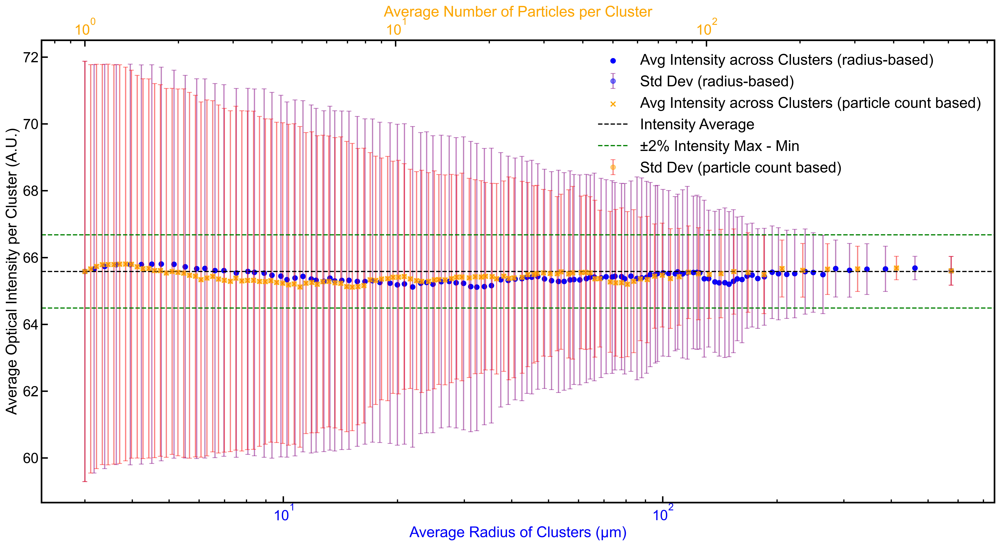

In [10]:
fig, ax1 = plt.subplots(figsize=(18, 10))

# Primary x-axis: Average Radius
ax1.scatter(scaled_cluster_radii_avg, avg_intensity, color='blue', marker='o', label='Avg Intensity across Clusters (radius-based)')
ax1.errorbar(scaled_cluster_radii_avg, avg_intensity, yerr=std_int, fmt='o', color='blue', ecolor='purple', alpha=0.5, capsize=3, label='Std Dev (radius-based)')
ax1.set_xscale('log')
ax1.set_xlabel('Average Radius of Clusters (μm)', color='blue')
ax1.tick_params(axis='x', labelcolor='blue')
ax1.set_ylabel('Average Optical Intensity per Cluster (A.U.)')
#ax1.grid(True, which='both', axis='both', linestyle='--', alpha=0.5)

# Secondary x-axis: Number of Particles per Cluster
ax2 = ax1.twiny()
ax2.scatter(avg_particles_per_cluster, avg_intensity, color='orange', marker='x', label='Avg Intensity across Clusters (particle count based)')
ax2.errorbar(avg_particles_per_cluster, avg_intensity, yerr=std_int1, fmt='o', color='orange', ecolor='red', alpha=0.5, capsize=3, label='Std Dev (particle count based)')
ax2.set_xscale('log')
ax2.set_xlabel('Average Number of Particles per Cluster', color='orange')
ax2.tick_params(axis='x', labelcolor='orange')


plt.axhline(y= avg_int, color='black', linestyle='--', linewidth=1.5, label='Intensity Average')
plt.axhline(y=plus_2_percent, color='green', linestyle='--', linewidth=1.5, label='±2% Intensity Max - Min')
plt.axhline(y=minus_2_percent, color='green', linestyle='--', linewidth=1.5)
# plt.axhline(y=plus_5_percent, color='red', linestyle='--', linewidth=1.5, label='+5% Intensity Max - Min')
# plt.axhline(y=minus_5_percent, color='red', linestyle='--', linewidth=1.5, label='-5% Intensity Max - Min')


# Combine legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, frameon = False, loc='upper right')
plt.tight_layout()
#plt.title('Average Intensity vs Radius and Particle Count for NMC 622 d_SOC = 90%')
plt.show()

Heterogeneity radius


Peason's correlation: 
<br>
$$ \rho(I_i, I_j) =  \frac{\Sigma(I_i - \bar{I}_i)(I_j - \bar{I}_j)}{\sqrt{(\Sigma(I_i - \bar{I}_i)^2 (I_j - \bar{I}_j)^2)}}$$

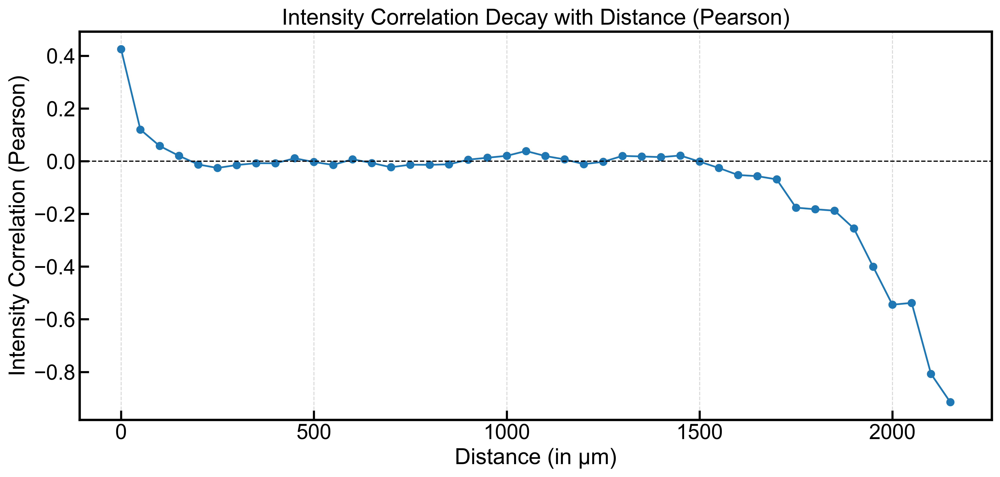

In [11]:
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt

positions = df[['x', 'y']].values
intensities = df['intensity'].values

# Compute pairwise distances in pixels
distances = cdist(positions, positions, metric='euclidean')

# Convert distances to physical units (micrometers)
scale_factor = 500 / 3540  # μm/pixel 
distances_physical = distances * scale_factor

# Define distance bins in physical units
bin_size = 50  # (adjust as needed)
max_distance = np.max(distances_physical)
bins = np.arange(0, max_distance, bin_size)

# Calculate correlation for each bin
pearson_correlations = []
for i in range(len(bins) - 1):
    # Mask for elements within the current bin range
    bin_mask = (distances_physical >= bins[i]) & (distances_physical < bins[i+1])
    
    # Get the indices of the True values in bin_mask
    row_idx, col_idx = np.where(bin_mask)
    
    # Select intensity values for pairs within the bin
    I_i = intensities[row_idx]
    I_j = intensities[col_idx]

    # Calculate Pearson correlation if there are enough pairs, otherwise append NaN
    if len(I_i) > 1:  # Need at least two values for correlation
        pearson_correlation = np.corrcoef(I_i, I_j)[0, 1]
        pearson_correlations.append(pearson_correlation)
    else:
        pearson_correlations.append(np.nan)


# Plot correlation decay
fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(bins[:-1], pearson_correlations, marker='o')
ax.set_xlabel("Distance (in μm)")
ax.set_ylabel("Intensity Correlation (Pearson)")
ax.set_title("Intensity Correlation Decay with Distance (Pearson)")
ax.grid(True, which='both', axis='x', linestyle='--', alpha=0.5)
ax.axhline(0, color='black', linestyle='--', lw=1)
plt.show()

Spearman Correlation 
<br>
$$ \rho = 1 - \frac{6 \Sigma d_i^2}{n(n^2-1)} $$ 
or 
$$ \rho = \frac{cov(rank(I_i), rank(I_j))}{\sigma_{rank(I_i)} \sigma_{rank(I_j)}} $$

In [12]:
from scipy.stats import spearmanr

positions = df[['x', 'y']].values
intensities = df['intensity'].values

# Compute pairwise distances
distances = cdist(positions, positions, metric='euclidean')

# Convert distances to physical units (micrometers)
scale_factor = 500 / 3540  # μm/pixel 
distances_physical = distances * scale_factor

# Define distance bins
bin_size = 50  # adjust as needed
max_distance = np.max(distances_physical)
bins = np.arange(0, max_distance, bin_size)

# Calculate correlation for each bin
spearman_correlations = []
for i in range(len(bins) - 1):
    # Mask for elements within the current bin range
    bin_mask = (distances_physical >= bins[i]) & (distances_physical < bins[i+1])
    
    # Get the indices of the True values in bin_mask
    row_idx, col_idx = np.where(bin_mask)
    
    # Select intensity values for pairs within the bin
    I_i = intensities[row_idx]
    I_j = intensities[col_idx]

    # Calculate Spearman correlation if there are enough pairs, otherwise append NaN
    if len(I_i) > 1:  # Need at least two values for correlation
        spearman_correlation, _ = spearmanr(I_i, I_j)
        spearman_correlations.append(spearman_correlation)
    else:
        spearman_correlations.append(np.nan)

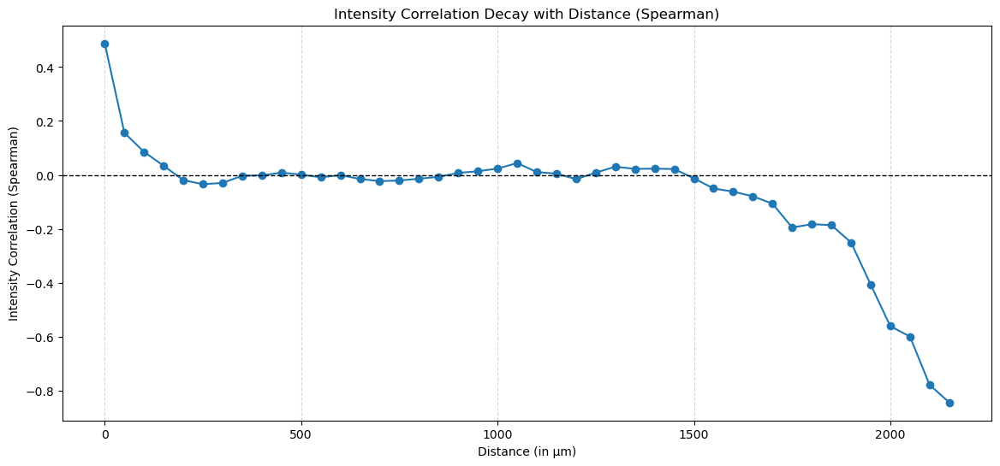

In [42]:
fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(bins[:-1], spearman_correlations, marker='o')
ax.set_xlabel("Distance (in μm)")
ax.set_ylabel("Intensity Correlation (Spearman)")
ax.set_title("Intensity Correlation Decay with Distance (Spearman)")
ax.grid(True, which='both', axis='x', linestyle='--', alpha=0.5)
ax.axhline(0, color='black', linestyle='--', lw=1)
plt.show()

Kendall tau
<br>
$$ \tau = \frac{\text{Number of concordant pairs - Number of discordant pairs}}{^{n}C_2} $$
Pair (i,j) is concordant if $(I_{i1} - I_{j1})$ and $(I_{i2} - I_{j2})$ have same sign  
Pair (i,j) is discordant if $(I_{i1} -I_{j1})$ and $(I_{i2} - I_{j2})$ have opposite sign

In [13]:
from scipy.stats import kendalltau

positions = df[['x', 'y']].values
intensities = df['intensity'].values

# Compute pairwise distances
distances = cdist(positions, positions, metric='euclidean')

# Convert distances to physical units (micrometers)
scale_factor = 500 / 3540  # μm/pixel 
distances_physical = distances * scale_factor

# Define distance bins
bin_size = 50  # adjust as needed
max_distance = np.max(distances_physical)
bins = np.arange(0, max_distance, bin_size)

# Calculate correlation for each bin
kendall_correlations = []
for i in range(len(bins) - 1):
    # Mask for elements within the current bin range
    bin_mask = (distances_physical >= bins[i]) & (distances_physical < bins[i+1])
    
    # Get the indices of the True values in bin_mask
    row_idx, col_idx = np.where(bin_mask)
    
    # Select intensity values for pairs within the bin
    I_i = intensities[row_idx]
    I_j = intensities[col_idx]

    # Calculate Spearman correlation if there are enough pairs, otherwise append NaN
    if len(I_i) > 1:  # Need at least two values for correlation
        kendall_correlation, _ = kendalltau(I_i, I_j)
        kendall_correlations.append(kendall_correlation)
    else:
        kendall_correlations.append(np.nan)

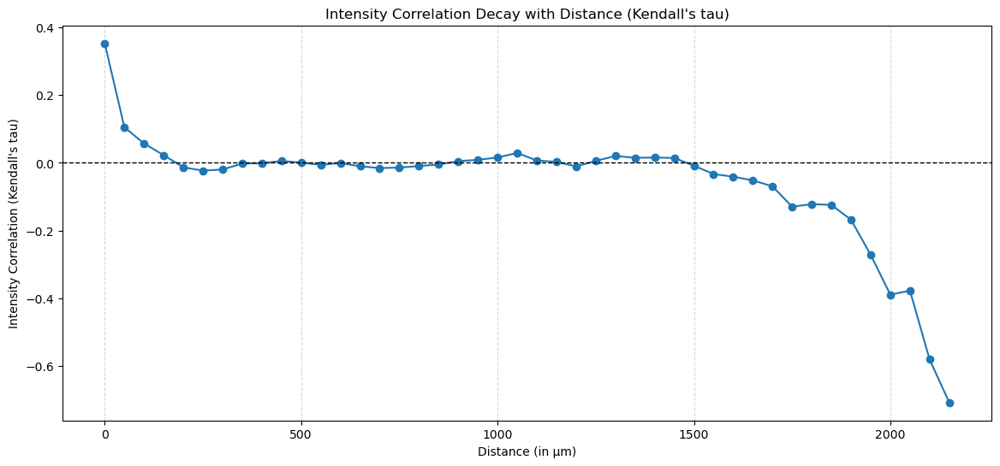

In [47]:
# Plot correlation decay
fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(bins[:-1], kendall_correlations, marker='o')
ax.set_xlabel("Distance (in μm)")
ax.set_ylabel("Intensity Correlation (Kendall's tau)")
ax.set_title("Intensity Correlation Decay with Distance (Kendall's tau)")
ax.grid(True, which='both', axis='x', linestyle='--', alpha=0.5)
ax.axhline(0, color='black', linestyle='--', lw=1)

plt.show()

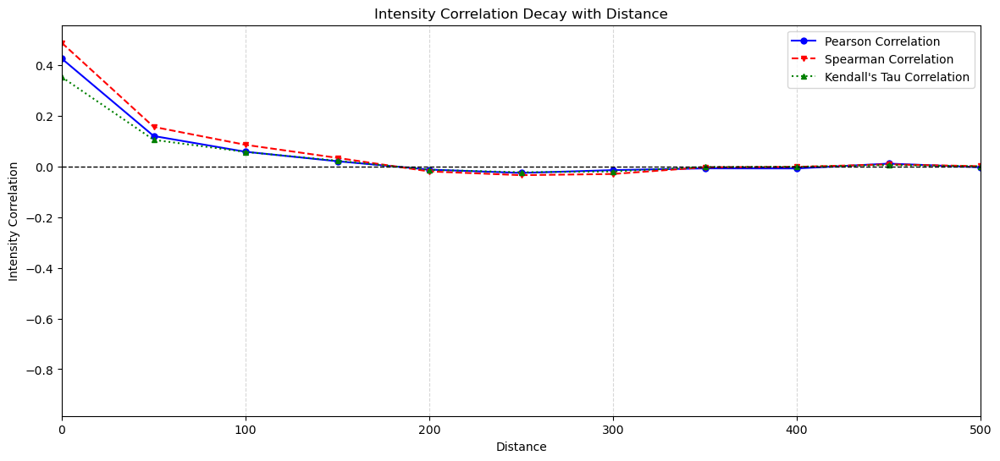

In [48]:
### Combined Zoomed In plot ###

# Plot correlation decay
fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(bins[:-1], pearson_correlations, marker='o', markersize ='5', color= 'blue', linestyle = 'solid', label = 'Pearson Correlation')
ax.plot(bins[:-1], spearman_correlations, marker='v', markersize ='5', color = 'red', linestyle = 'dashed', label = 'Spearman Correlation')
ax.plot(bins[:-1], kendall_correlations, marker='^', markersize ='5', color = 'green', linestyle = 'dotted', label = "Kendall's Tau Correlation")
#ax.plot(bins[:-1], dcorrelations, marker='h', markersize ='5', color = 'black', linestyle = 'dashdot', label = 'DCorr')
ax.set_xlabel("Distance")
ax.set_ylabel("Intensity Correlation")
ax.set_title("Intensity Correlation Decay with Distance")
ax.grid(True, which='both', axis='x', linestyle='--', alpha=0.5)
ax.axhline(0, color='black', linestyle='--', lw=1)
ax.set_xlim(0, 500)
#ax.set_ylim(-0.1, 0.1)
ax.legend()
plt.show()

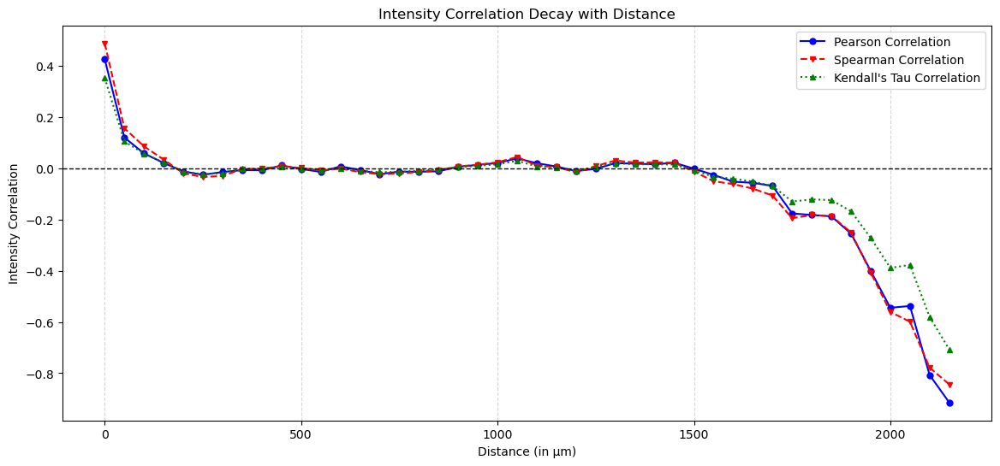

In [49]:
### Combined Zoomed In plot ###

# Plot correlation decay
fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(bins[:-1], pearson_correlations, marker='o', markersize ='5', color= 'blue', linestyle = 'solid', label = 'Pearson Correlation')
ax.plot(bins[:-1], spearman_correlations, marker='v', markersize ='5', color = 'red', linestyle = 'dashed', label = 'Spearman Correlation')
ax.plot(bins[:-1], kendall_correlations, marker='^', markersize ='5', color = 'green', linestyle = 'dotted', label = "Kendall's Tau Correlation")
#ax.plot(bins[:-1], dcorrelations, marker='h', markersize ='5', color = 'black', linestyle = 'dashdot', label = 'DCorr')
ax.set_xlabel("Distance (in μm)")
ax.set_ylabel("Intensity Correlation")
ax.set_title("Intensity Correlation Decay with Distance")
ax.grid(True, which='both', axis='x', linestyle='--', alpha=0.5)
ax.axhline(0, color='black', linestyle='--', lw=1)
#ax.set_xlim(1000, 6000)
#ax.set_ylim(-0.07, 0.08)
ax.legend()
plt.show()

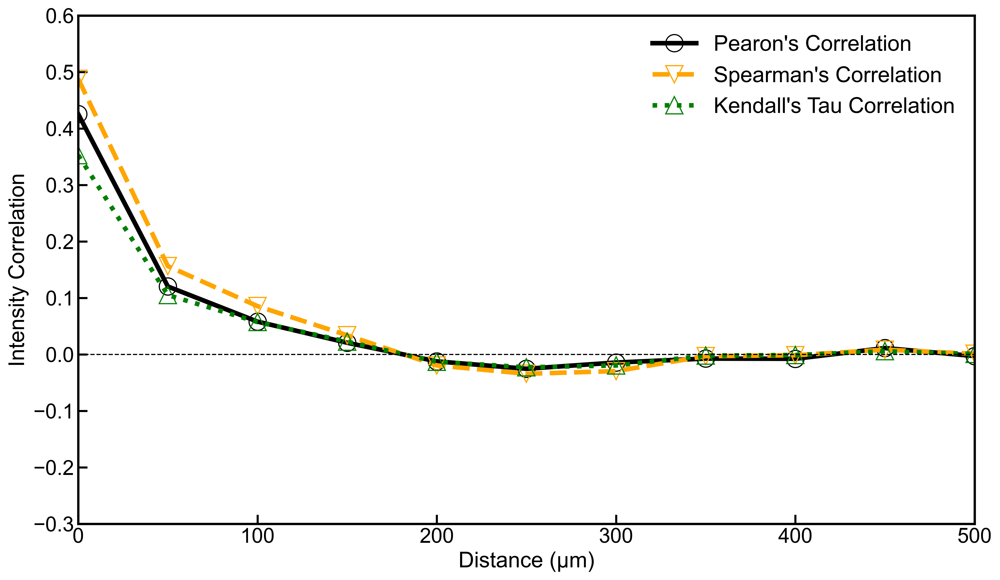

In [16]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(bins[:-1], pearson_correlations, marker='o', markersize=15, color='black', markerfacecolor='none', linestyle='solid', linewidth=4, label="Pearon's Correlation")
ax.plot(bins[:-1], spearman_correlations, marker='v', markersize=15, color='orange', markerfacecolor='none', linestyle='dashed', linewidth=4, label="Spearman's Correlation")
ax.plot(bins[:-1], kendall_correlations, marker='^', markersize=15, color='green', markerfacecolor='none', linestyle='dotted', linewidth=4, label="Kendall's Tau Correlation")

ax.legend(loc="upper right", frameon=False)  
ax.set_xlabel("Distance (μm)")
ax.set_ylabel("Intensity Correlation")
#ax.set_title("Intensity Correlation Decay with Distance for NMC 622 c_SOC = 77%")
#ax.grid(True, which='both', axis='x', linestyle='--', alpha=0.5)
ax.axhline(0, color='black', linestyle='--', lw=1)
ax.set_xlim(0, 500)
ax.set_ylim(-0.3, 0.6)

plt.show()